In [2]:
!pip install transformers

     |████████████████████████████████| 3.1 MB 4.0 MB/s 
     |████████████████████████████████| 895 kB 46.8 MB/s 
     |████████████████████████████████| 3.3 MB 55.9 MB/s 
     |████████████████████████████████| 61 kB 457 kB/s 
     |████████████████████████████████| 596 kB 75.5 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [3]:
!pip install torch torchvision torchaudio numpy matplotlib

In [4]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


In [5]:
import os
from os import path as osp
from tqdm import tqdm
from PIL import Image
from torchvision.transforms import ToTensor
from torchvision import transforms
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from transformers import ViTFeatureExtractor
from transformers import ViTModel, ViTConfig
import scipy.io
from skimage.transform import resize
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio
from torch.utils.data import DataLoader
# Preprocessing (Not needed to be done anymore since everyone already has the data)
# i=0
# j=0
# for folder in os.listdir('Data'):
#   for filename in os.listdir('Data/' + folder):
#     if 'GT' in filename:
#       image = Image.open('Data/' + folder + '/' + filename)
#       new_image = image.resize((512, 512))
#       new_image.save('SIDD_Data/val/' + str(i) + filename)
#       i+=1
#     else:
#       image = Image.open('Data/' + folder + '/' + filename)
#       new_image = image.resize((512, 512))
#       new_image.save('SIDD_Data/train/' + str(j) + filename)
#       j+=1

In [6]:
## Credit to ADNET https://github.com/hellloxiaotian/ADNet/blob/master/color/dataset.py

import os
import os.path
import numpy as np
import random
import h5py
import torch
import cv2
import glob
import torch.utils.data as udata
import torch
import torch.nn as nn

def data_augmentation(image, mode):
    out = np.transpose(image, (1,2,0))
    #out = image
    if mode == 0:
        # original
        out = out
    elif mode == 1:
        # flip up and down
        out = np.flipud(out)
    elif mode == 2:
        # rotate counterwise 90 degree
        out = np.rot90(out)
    elif mode == 3:
        # rotate 90 degree and flip up and down
        out = np.rot90(out)
        out = np.flipud(out)
    elif mode == 4:
        # rotate 180 degree
        out = np.rot90(out, k=2)
    elif mode == 5:
        # rotate 180 degree and flip
        out = np.rot90(out, k=2)
        out = np.flipud(out)
    elif mode == 6:
        # rotate 270 degree
        out = np.rot90(out, k=3)
    elif mode == 7:
        # rotate 270 degree and flip
        out = np.rot90(out, k=3)
        out = np.flipud(out)
    return np.transpose(out, (2,0,1))
    #return out

def normalize(data):
    return data/255.

def Im2Patch(img, win, stride=1):
    k = 0
    endc = img.shape[0]
    #print endc
    endw = img.shape[1]
    endh = img.shape[2]
    patch = img[:, 0:endw-win+0+1:stride, 0:endh-win+0+1:stride]
    TotalPatNum = patch.shape[1] * patch.shape[2]
    Y = np.zeros([endc, win*win,TotalPatNum], np.float32)
    for i in range(win):
        for j in range(win):
            patch = img[:,i:endw-win+i+1:stride,j:endh-win+j+1:stride]
            Y[:,k,:] = np.array(patch[:]).reshape(endc, TotalPatNum)
            k = k + 1
    return Y.reshape([endc, win, win, TotalPatNum])

def prepare_data(data_path, test_data_path, patch_size, stride, train_bool=False, aug_times=1,  dim=(256,256)):
    # train
    if train_bool:
      print('process training data')
      scales = [1, 0.9, 0.8, 0.7]
      files = os.listdir(data_path)
      files.sort()
      h5f = h5py.File('train.h5', 'w')
      train_num = 0
      for i in range(len(files)):
          img = cv2.imread(data_path + '/' + files[i])
          img = cv2.resize(img, dim)
          h, w, c = img.shape
          for k in range(len(scales)):
              Img = cv2.resize(img, (int(h*scales[k]), int(w*scales[k])), interpolation=cv2.INTER_CUBIC)
              Img = torch.tensor(Img)
              Img = Img.permute(2,0,1)
              Img = Img.numpy()
              Img = np.float32(normalize(Img))
              patches = Im2Patch(Img, win=patch_size, stride=stride)
              print("file: %s scale %.1f # samples: %d" % (files[i], scales[k], patches.shape[3]*aug_times))
              for n in range(patches.shape[3]):
                  data = patches[:,:,:,n].copy()
                  h5f.create_dataset(str(train_num), data=data)
                  train_num += 1
                  for m in range(aug_times-1):
                      data_aug = data_augmentation(data, np.random.randint(1,8))
                      h5f.create_dataset(str(train_num)+"_aug_%d" % (m+1), data=data_aug)
                      train_num += 1
      h5f.close()
    # val
    print('\nprocess validation data')
    files = os.listdir(test_data_path)
    files.sort()
    h5f = h5py.File('val.h5', 'w')
    val_num = 0
    for i in range(len(files)):
        print("file: %s" % files[i])
        img = cv2.imread(test_data_path + '/' + files[i])
        img = cv2.resize(img, (50,50))
        img = torch.tensor(img)
        img = img.permute(2,0,1)
        img = img.numpy()
        img = np.float32(normalize(img))
        h5f.create_dataset(str(val_num), data=img)
        val_num += 1
    h5f.close()
    if train_bool:
      print('training set, # samples %d\n' % train_num)
    print('val set, # samples %d\n' % val_num)

class KodakDataset(udata.Dataset):
    def __init__(self, train=True):
        super(KodakDataset, self).__init__()
        self.train = train
        if self.train:
            h5f = h5py.File('drive/MyDrive/Colab Notebooks/DLS Final Project Data/SIDD_medium_preprocessed/train.h5', 'r')
        else:
            h5f = h5py.File('drive/MyDrive/Colab Notebooks/DLS Final Project Data/SIDD_medium_preprocessed/kodak_val.h5', 'r')
        self.keys = list(h5f.keys())
        random.shuffle(self.keys)
        h5f.close()
    def __len__(self):
        return len(self.keys)
    def __getitem__(self, index):
        if self.train:
            h5f = h5py.File('drive/MyDrive/Colab Notebooks/DLS Final Project Data/SIDD_medium_preprocessed/train.h5', 'r')
        else:
            h5f = h5py.File('drive/MyDrive/Colab Notebooks/DLS Final Project Data/SIDD_medium_preprocessed/kodak_val.h5', 'r')
        key = self.keys[index]
        data = np.array(h5f[key])
        h5f.close()
        return torch.Tensor(data)

class CBSDDataset(udata.Dataset):
    def __init__(self, train=True):
        super(CBSDDataset, self).__init__()
        self.train = train
        if self.train:
            h5f = h5py.File('drive/MyDrive/Colab Notebooks/DLS Final Project Data/SIDD_medium_preprocessed/train.h5', 'r')
        else:
            h5f = h5py.File('drive/MyDrive/Colab Notebooks/DLS Final Project Data/SIDD_medium_preprocessed/val.h5', 'r')
        self.keys = list(h5f.keys())
        random.shuffle(self.keys)
        h5f.close()
    def __len__(self):
        return len(self.keys)
    def __getitem__(self, index):
        if self.train:
            h5f = h5py.File('drive/MyDrive/Colab Notebooks/DLS Final Project Data/SIDD_medium_preprocessed/train.h5', 'r')
        else:
            h5f = h5py.File('drive/MyDrive/Colab Notebooks/DLS Final Project Data/SIDD_medium_preprocessed/val.h5', 'r')
        key = self.keys[index]
        data = np.array(h5f[key])
        h5f.close()
        return torch.Tensor(data)

In [7]:
# Get data in tensors
train_data=[]
val_data=[]
# # Change to your own path
path = 'drive/MyDrive/Colab Notebooks/DLS Final Project Data/SIDD_medium/'
test_path = 'drive/MyDrive/Colab Notebooks/DLS Final Project Data/Kodak24/original'
# for filename in os.listdir(path +'train'):
#     image = Image.open(path + 'train/' + filename)
#     image = image.resize((256, 256))
#     image = ToTensor()(image) # unsqueeze to add artificial first dimension
#     train_data.append(image)

# for filename in os.listdir(path +'val'):
#     image = Image.open(path + 'val/' + filename)
#     image = image.resize((50, 50))
#     image = ToTensor()(image) # unsqueeze to add artificial first dimension
#     val_data.append(image)

# prepare_data(path, test_path, patch_size=50, stride=40)

BATCH_SIZE = 5

dataset_train = KodakDataset(train=True)
dataset_val = KodakDataset(train=False)
dataset_cbsd_val = CBSDDataset(train=False)

train_loader = DataLoader(dataset=dataset_train, num_workers=4, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
kodak_test_loader = DataLoader(dataset=dataset_val, num_workers=4, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
cbsd_test_loader =  DataLoader(dataset=dataset_cbsd_val, num_workers=4, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

# train_loader = DataLoader(train_data, batch_size = BATCH_SIZE, shuffle=False)
# val_loader = DataLoader(val_data, batch_size = BATCH_SIZE, shuffle=False)
  

# Uncomment below to use sidd test data

In [8]:
# # Preprocess testing data from mat file -> resize and move channel column to front as np -> convert to tensor
sidd_test_path = 'drive/MyDrive/Colab Notebooks/DLS Final Project Data/SIDD_Data/'


benchmark_y = np.array(scipy.io.loadmat(sidd_test_path + 'ValidationGtBlocksSrgb.mat')['ValidationGtBlocksSrgb'])
benchmark_y = benchmark_y.reshape(-1, 256, 256, 3)
benchmark_val =[]
for y in benchmark_y:
  img = resize(y[:], (50, 50))
  img = np.moveaxis(img, -1, 0)
  benchmark_val.append(img)
benchmark_val = np.array(benchmark_val)

# benchmark_train = torch.from_numpy(benchmark_train)
benchmark_val = torch.from_numpy(benchmark_val)

# Load data into dataloader
BATCH_SIZE = 5

sidd_test_loader = DataLoader(benchmark_val, batch_size = BATCH_SIZE, shuffle=True, drop_last=True)

In [9]:
# test_variation = 'noisy5'
# # Get data in tensors
# test_data=[]
# test_val_data=[]

# BATCH_SIZE = 5
# # Change to your own path
# path = 'drive/MyDrive/Colab Notebooks/DLS Final Project Data/CBSD68/'
# for filename in os.listdir(path + test_variation):
#     image = Image.open(path + test_variation + '/' + filename)
#     image = image.resize((256, 256))
#     image = ToTensor()(image) # unsqueeze to add artificial first dimension
#     test_data.append(image)

# for filename in os.listdir(path + 'original'):
#     image = Image.open(path + 'original/' + filename)
#     image = image.resize((256, 256))
#     image = ToTensor()(image) # unsqueeze to add artificial first dimension
#     test_val_data.append(image)

# test_loader = DataLoader(test_data, batch_size = BATCH_SIZE, shuffle=False, drop_last = True)
# test_val_loader = DataLoader(test_val_data, batch_size = BATCH_SIZE, shuffle=False, drop_last = True)

In [10]:
def display_tensor_image(result):
    im = transforms.ToPILImage()(result).convert("RGB")
    im = im.resize((50,50))
    display(im)

In [11]:
def compute_avg_psnr(gt_img, output_img, data_range=1):
  gt_img = gt_img.detach().cpu().numpy().astype(np.float32)
  output_img = output_img.detach().cpu().numpy().astype(np.float32)
  PSNR=0
  for i in range(gt_img.shape[0]):
    PSNR += peak_signal_noise_ratio(output_img[i,:,:,:], gt_img[i,:,:,:], data_range=data_range)
  return PSNR/gt_img.shape[0]

In [12]:
def compute_avg_psnr_with_images(gt_img, output_img, input_img, data_range=1):
  input_img1 = input_img.detach().cpu().numpy().astype(np.float32)
  gt_img1 = gt_img.detach().cpu().numpy().astype(np.float32)
  output_img1 = output_img.detach().cpu().numpy().astype(np.float32)
  PSNR=0
  for i in range(gt_img.shape[0]):
    original_psnr = peak_signal_noise_ratio(input_img1[i,:,:,:], gt_img1[i,:,:,:], data_range=data_range)
    temp_psnr = peak_signal_noise_ratio(output_img1[i,:,:,:], gt_img1[i,:,:,:], data_range=data_range)
    PSNR += temp_psnr
    print("PSNR from input: " + str(original_psnr))
    print("Input: ")
    display_tensor_image(input_img[i,:,:,:])
    print("PSNR from output: " + str(temp_psnr))
    print("Output")
    display_tensor_image(output_img[i,:,:,:])
    print("Ground truth:")
    display_tensor_image(gt_img[i,:,:,:])
  return PSNR/gt_img.shape[0]

In [39]:

# Vit Model
vitmodel = ViTModel.from_pretrained('google/vit-base-patch16-224-in21k')

# Feature Extractor
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224-in21k')

class ViTDenoiser(nn.Module):
  def __init__(self):
    super(ViTDenoiser, self).__init__()
    self.vit = vitmodel
    # The multiplied 197 in the first layer input size is because the hidden state is reshaped into 2d tensor and there were 197 rows for some reason
    self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.vit.config.hidden_size*197, 512),
            torch.nn.ReLU(),
            torch.nn.Linear(512, 1024),
            torch.nn.ReLU(),
            torch.nn.Linear(1024, 2048),
            torch.nn.ReLU(),
            torch.nn.Linear(2048, 3*50*50),
            torch.nn.Sigmoid()
        )
    
  def forward(self, x):
    outputs = self.vit(pixel_values=x)
    decoded = self.decoder(outputs.last_hidden_state.view(BATCH_SIZE, -1))
    return decoded.view(BATCH_SIZE, 3, 50, 50)

model = ViTDenoiser()

configuration = ViTConfig()
np_vit = ViTModel(configuration)

# No pretraining
class NPViTDenoiser(nn.Module):
  def __init__(self):
    super(NPViTDenoiser, self).__init__()
    self.vit = np_vit
    # The multiplied 197 in the first layer input size is because the hidden state is reshaped into 2d tensor and there were 197 rows for some reason
    self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.vit.config.hidden_size*197, 512),
            torch.nn.ReLU(),
            torch.nn.Linear(512, 1024),
            torch.nn.ReLU(),
            torch.nn.Linear(1024, 2048),
            torch.nn.ReLU(),
            torch.nn.Linear(2048, 3*50*50),
            torch.nn.Sigmoid()
        )
    
  def forward(self, x):
    outputs = self.vit(pixel_values=x)
    decoded = self.decoder(outputs.last_hidden_state.view(BATCH_SIZE, -1))
    return decoded.view(BATCH_SIZE, 3, 50, 50)

np_model = NPViTDenoiser()

# CNN decoder
class ViTCNNDenoiser(nn.Module):
  def __init__(self):
    super(ViTCNNDenoiser, self).__init__()
    self.vit = np_vit
    # The multiplied 197 in the first layer input size is because the hidden state is reshaped into 2d tensor and there were 197 rows for some reason
    self.decoder = torch.nn.Sequential(
            torch.nn.Conv1d(in_channels=3, out_channels=3, kernel_size=5, stride=1, bias=None),
            torch.nn.ReLU(inplace=True),
            torch.nn.Conv1d(in_channels=3, out_channels=3, kernel_size=5, stride=1, bias=None),
            torch.nn.ReLU(inplace=True),
            torch.nn.Conv1d(in_channels=3, out_channels=3, kernel_size=1, stride=1, bias=None),
            torch.nn.ReLU(inplace=True),
            torch.nn.Linear(50424, 50*50),
            torch.nn.Sigmoid()
        )
    
  def forward(self, x):
    outputs = self.vit(pixel_values=x)
    decoded = self.decoder(outputs.last_hidden_state.view(BATCH_SIZE, 3, -1))
    return decoded.view(BATCH_SIZE, 3, 50, 50)

cnn_model = ViTCNNDenoiser()
# Learning rate
LEARNING_RATE = .00001

# ADAM optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
np_optimizer = torch.optim.Adam(np_model.parameters(), lr=LEARNING_RATE)
cnn_optimizer = torch.optim.Adam(cnn_model.parameters(), lr=LEARNING_RATE)

# VitDenoiser
Denoiser = ViTDenoiser()

# Loss function
loss_function = torch.nn.MSELoss()
criterion = loss_function

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') 
if torch.cuda.is_available():
    model.cuda()
    np_model.cuda()
    cnn_model.cuda()

In [17]:
from tqdm import tqdm

noiseL = 15
feature_extractor = ViTFeatureExtractor(configuration)
def train(epoch, model, optimizer):
  # Function to train with VitDenoier backbone
  model.train()
  training_loss = 0
  training_psnr = 0

  for batch_index, images in enumerate(tqdm(train_loader)):
    optimizer.zero_grad()
    img_train = images
    mean = torch.zeros(img_train.size(), dtype=torch.float32)
    noise = torch.normal(mean=mean, std=noiseL/255.)
    imgn_train = torch.clamp(img_train + noise, 0., 1.)
    noise = Variable(noise.to(device))
    x = np.split(np.squeeze(np.array(imgn_train)), BATCH_SIZE)
    # Remove unecessary dimension
    for index, array in enumerate(x):
      x[index] = np.squeeze(array)
    # Apply feature extractor, stack back into 1 tensor and then convert to tensor
    model_input = torch.tensor(np.stack(feature_extractor(x)['pixel_values'], axis=0))
    model_input, val_images = Variable(model_input.to(device)), Variable(img_train.to(device))
    outputs = model(model_input)
    loss = criterion(outputs, val_images) 
    loss.backward()
    optimizer.step()
    training_loss += loss.item()
    training_psnr +=compute_avg_psnr(val_images, outputs)
  print('Epoch: ' + str(epoch) + ', Training MSE Loss: ' + str(training_loss/(batch_index+1)) + ', Training PSNR: ' +  str(training_psnr/(batch_index+1)))
  return training_loss/(batch_index+1), training_psnr/(batch_index+1)

In [18]:
def test(test_loader, model):
    test_psnr = 0
    test_loss = 0
    model.eval()
    with torch.no_grad():
      for batch_index, images in enumerate(tqdm(test_loader)): 
        img_test = images
        mean = torch.zeros(img_test.size(), dtype=torch.float32)
        noise = torch.normal(mean=mean, std=noiseL/255.)
        imgn_test = torch.clamp(img_test + noise, 0., 1.)
        noise = Variable(noise.to(device))
        x = np.split(np.squeeze(np.array(imgn_test)), BATCH_SIZE)
        # Remove unecessary dimension
        for index, array in enumerate(x):
          x[index] = np.squeeze(array)
        # Apply feature extractor, stack back into 1 tensor and then convert to tensor
        model_input = torch.tensor(np.stack(feature_extractor(x)['pixel_values'], axis=0))
        model_input, val_images =  Variable(model_input.to(device)),  Variable(img_test.to(device))
        outputs = model(model_input)
        psnr = compute_avg_psnr(val_images, outputs)
        test_psnr += psnr
        test_loss += criterion(outputs, val_images).item()
    print('Epoch: ' + str(epoch) + ', Test MSE Loss: ' + str(test_loss/(batch_index+1)) + ', Test PSNR: ' + str(test_psnr/(batch_index+1)))
    return test_loss/(batch_index+1),  test_psnr/(batch_index+1)

In [40]:
# Model

trn_loss = []
trn_psnr = []
sidd_tst_loss = []
sidd_tst_psnr = []
cbsd_tst_loss = []
cbsd_tst_psnr = []
kodak_tst_loss = []
kodak_tst_psnr = []

models = []
    
#RETURN LOSS AFTER EACH EPOCH
for epoch in range(5):
    epoch_loss, epoch_psnr = train(epoch, cnn_model, cnn_optimizer)
    trn_loss.append(epoch_loss)
    trn_psnr.append(epoch_psnr)
    models.append(model)
    t_epoch_loss, t_epoch_psnr = test(sidd_test_loader, cnn_model)
    sidd_tst_loss.append(t_epoch_loss)
    sidd_tst_psnr.append(t_epoch_psnr)
    t_epoch_loss, t_epoch_psnr = test(cbsd_test_loader, cnn_model)
    cbsd_tst_loss.append(t_epoch_loss)
    cbsd_tst_psnr.append(t_epoch_psnr)
    t_epoch_loss, t_epoch_psnr = test(kodak_test_loader, cnn_model)
    kodak_tst_loss.append(t_epoch_loss)
    kodak_tst_psnr.append(t_epoch_psnr)

100%|██████████| 5952/5952 [16:56<00:00,  5.86it/s]


Epoch: 0, Training MSE Loss: 0.006965752903314389, Training PSNR: 24.318243858100118


100%|██████████| 256/256 [00:12<00:00, 20.37it/s]


Epoch: 0, Test MSE Loss: 0.0020227045394899013, Test PSNR: 30.48327039093378


100%|██████████| 13/13 [00:01<00:00, 12.34it/s]


Epoch: 0, Test MSE Loss: 0.020649140055936117, Test PSNR: 17.582630996981866


100%|██████████| 4/4 [00:00<00:00,  6.90it/s]


Epoch: 0, Test MSE Loss: 0.01646999060176313, Test PSNR: 18.20550992802876


100%|██████████| 5952/5952 [16:57<00:00,  5.85it/s]


Epoch: 1, Training MSE Loss: 0.003093826538593363, Training PSNR: 27.116276460005672


100%|██████████| 256/256 [00:12<00:00, 20.30it/s]


Epoch: 1, Test MSE Loss: 0.0012285858289069632, Test PSNR: 31.829017779498376


100%|██████████| 13/13 [00:01<00:00, 12.34it/s]


Epoch: 1, Test MSE Loss: 0.015925205169388883, Test PSNR: 18.677956176595146


100%|██████████| 4/4 [00:00<00:00,  6.84it/s]


Epoch: 1, Test MSE Loss: 0.011739461915567517, Test PSNR: 19.64968222633901


100%|██████████| 5952/5952 [16:57<00:00,  5.85it/s]


Epoch: 2, Training MSE Loss: 0.001941091400499073, Training PSNR: 28.675290332999953


100%|██████████| 256/256 [00:12<00:00, 20.34it/s]


Epoch: 2, Test MSE Loss: 0.0010256207238208079, Test PSNR: 32.465913856471765


100%|██████████| 13/13 [00:01<00:00, 12.22it/s]


Epoch: 2, Test MSE Loss: 0.013588515074493794, Test PSNR: 19.41024508132419


100%|██████████| 4/4 [00:00<00:00,  6.86it/s]


Epoch: 2, Test MSE Loss: 0.010570641839876771, Test PSNR: 20.077934335450237


100%|██████████| 5952/5952 [16:57<00:00,  5.85it/s]


Epoch: 3, Training MSE Loss: 0.0014254724204415309, Training PSNR: 29.66699256203862


100%|██████████| 256/256 [00:12<00:00, 20.40it/s]


Epoch: 3, Test MSE Loss: 0.0009268377320396383, Test PSNR: 32.78623561720659


100%|██████████| 13/13 [00:01<00:00, 12.32it/s]


Epoch: 3, Test MSE Loss: 0.01281019665587407, Test PSNR: 19.570162862226844


100%|██████████| 4/4 [00:00<00:00,  6.85it/s]


Epoch: 3, Test MSE Loss: 0.010754345799796283, Test PSNR: 20.17284837125176


100%|██████████| 5952/5952 [16:57<00:00,  5.85it/s]


Epoch: 4, Training MSE Loss: 0.001157249699615697, Training PSNR: 30.348356240099967


100%|██████████| 256/256 [00:12<00:00, 20.33it/s]


Epoch: 4, Test MSE Loss: 0.0009691510878705749, Test PSNR: 32.2712258702284


100%|██████████| 13/13 [00:01<00:00, 12.36it/s]


Epoch: 4, Test MSE Loss: 0.012009467069919292, Test PSNR: 19.882695802705623


100%|██████████| 4/4 [00:00<00:00,  6.79it/s]

Epoch: 4, Test MSE Loss: 0.010435433592647314, Test PSNR: 20.28039968747662


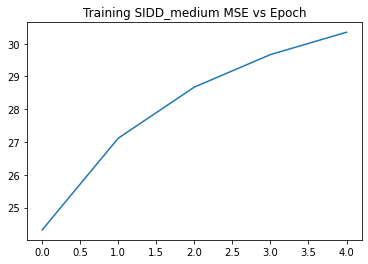

In [45]:
plt.title("Training SIDD_medium MSE vs Epoch")
plt.plot(trn_psnr)
plt.show()

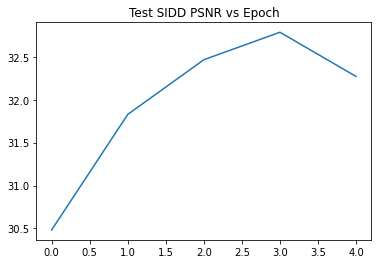

In [42]:
plt.title("Test SIDD PSNR vs Epoch")
plt.plot(sidd_tst_psnr)
plt.show()

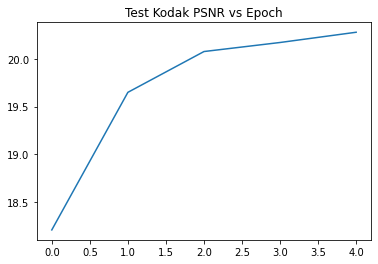

In [43]:
plt.title("Test Kodak PSNR vs Epoch")
plt.plot(kodak_tst_psnr)
plt.show()

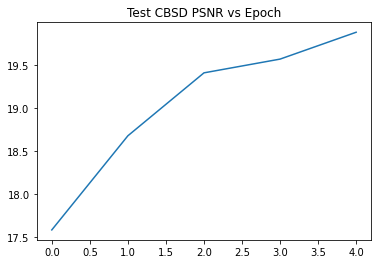

In [44]:
plt.title("Test CBSD PSNR vs Epoch")
plt.plot(cbsd_tst_psnr)
plt.show()

In [46]:
def test_with_images(test_loader, model, num_batches=5):
    test_psnr = 0
    test_loss = 0
    model.eval()
    i=0
    with torch.no_grad():
      for batch_index, images in enumerate(tqdm(test_loader)): 
        img_test = images
        mean = torch.zeros(img_test.size(), dtype=torch.float32)
        noise = torch.normal(mean=mean, std=noiseL/255.)
        imgn_test = torch.clamp(img_test + noise, 0., 1.)
        noise = Variable(noise.to(device))
        x = np.split(np.squeeze(np.array(imgn_test)), BATCH_SIZE)
        # Remove unecessary dimension
        for index, array in enumerate(x):
          x[index] = np.squeeze(array)
        # Apply feature extractor, stack back into 1 tensor and then convert to tensor
        model_input = torch.tensor(np.stack(feature_extractor(x)['pixel_values'], axis=0))
        model_input, val_images =  Variable(model_input.to(device)),  Variable(img_test.to(device))
        outputs = model(model_input)
        psnr = compute_avg_psnr_with_images(val_images, outputs, imgn_test)
        test_psnr += psnr
        test_loss += criterion(outputs, val_images).item()
        i+=1
        if i >= num_batches:
          break
    print('Epoch: ' + str(epoch) + ', Test MSE Loss: ' + str(test_loss/(batch_index+1)) + ', Test PSNR: ' + str(test_psnr/(batch_index+1)))
    return test_loss/(batch_index+1),  test_psnr/(batch_index+1)

  0%|          | 0/256 [00:00<?, ?it/s]

PSNR from input: 24.928142266235525
Input: 


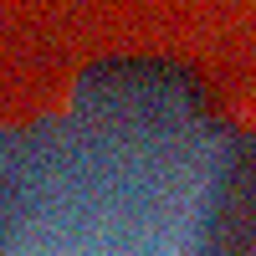

PSNR from output: 25.38273420213639
Output


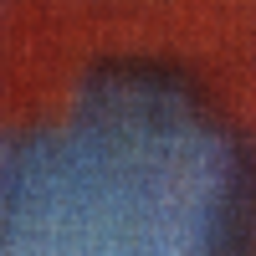

Ground truth:


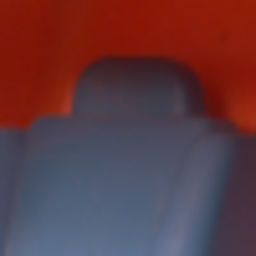

PSNR from input: 25.30210796094544
Input: 


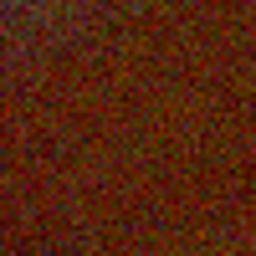

PSNR from output: 30.062381801804495
Output


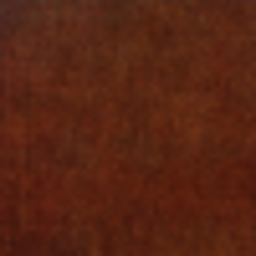

Ground truth:


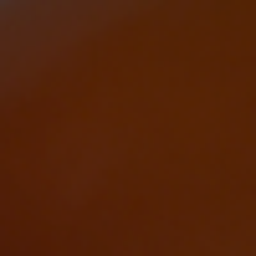

PSNR from input: 24.573075191432853
Input: 


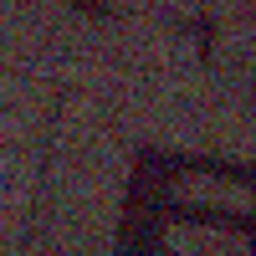

PSNR from output: 34.487752022817055
Output


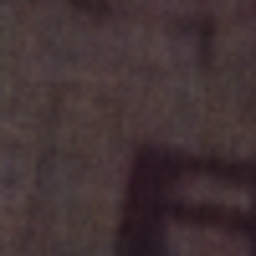

Ground truth:


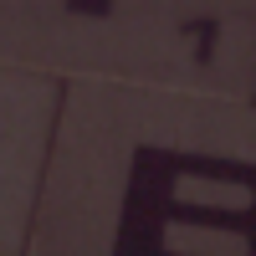

PSNR from input: 24.553563701735573
Input: 


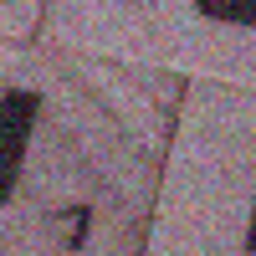

PSNR from output: 28.30525776083973
Output


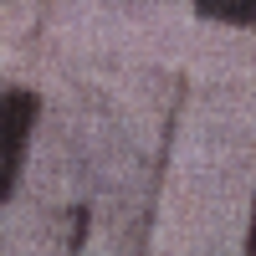

Ground truth:


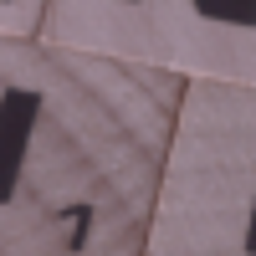

PSNR from input: 24.537096481032222
Input: 


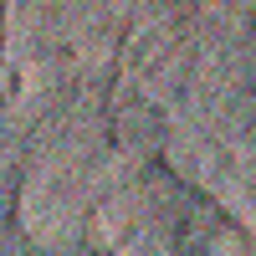

PSNR from output: 28.4883446561117
Output


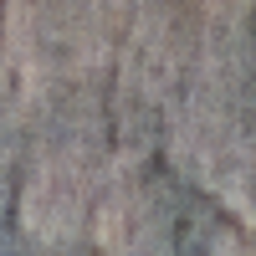

Ground truth:


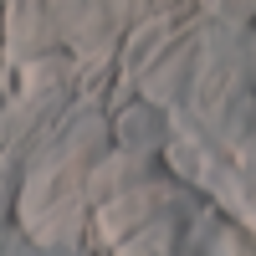

  0%|          | 1/256 [00:00<02:23,  1.77it/s]

PSNR from input: 24.637366914482755
Input: 


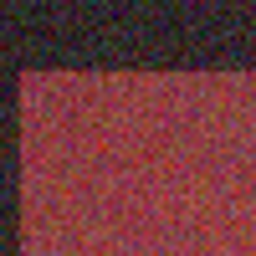

PSNR from output: 30.112780180396378
Output


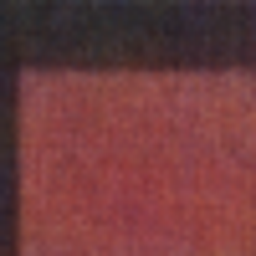

Ground truth:


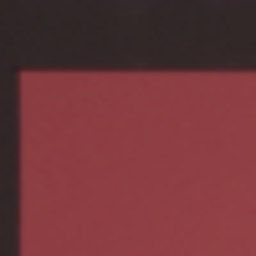

PSNR from input: 24.66849541830152
Input: 


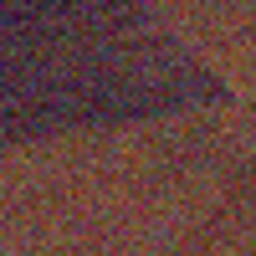

PSNR from output: 31.82271404175819
Output


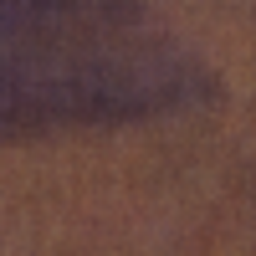

Ground truth:


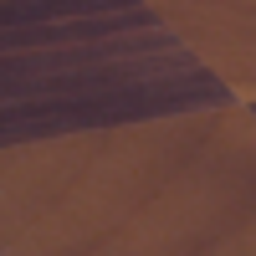

PSNR from input: 24.654276579075344
Input: 


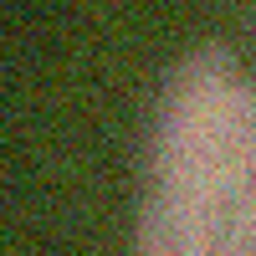

PSNR from output: 31.94510829743095
Output


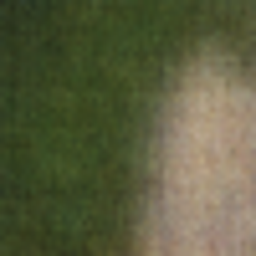

Ground truth:


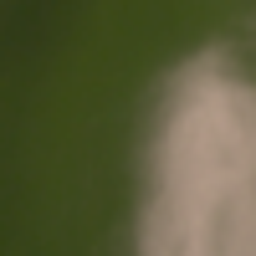

PSNR from input: 24.60155819979194
Input: 


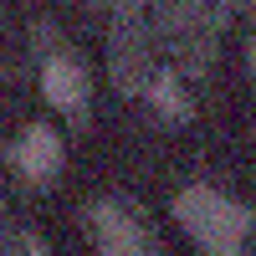

PSNR from output: 30.452387780719633
Output


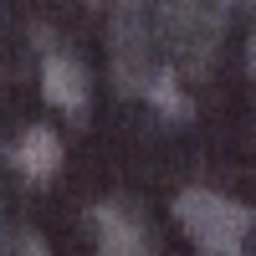

Ground truth:


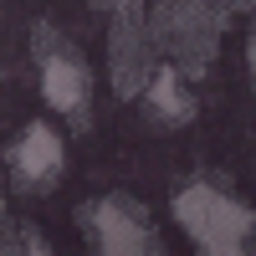

PSNR from input: 24.564782046928837
Input: 


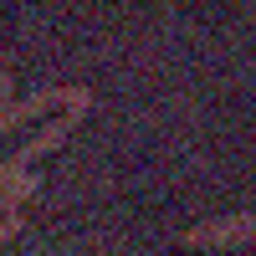

PSNR from output: 32.85506739572281
Output


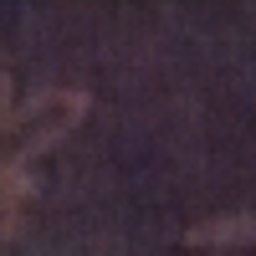

Ground truth:


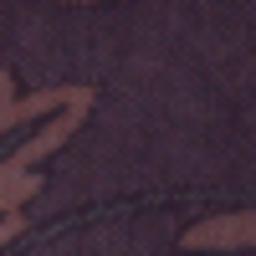

  1%|          | 2/256 [00:01<02:20,  1.81it/s]

PSNR from input: 24.811201117423852
Input: 


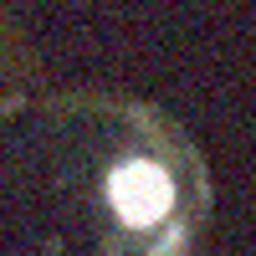

PSNR from output: 27.404473523478913
Output


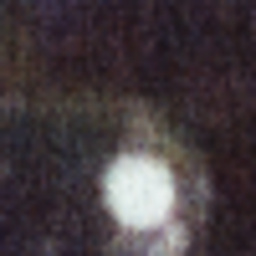

Ground truth:


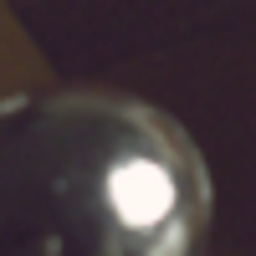

PSNR from input: 26.325550618700365
Input: 


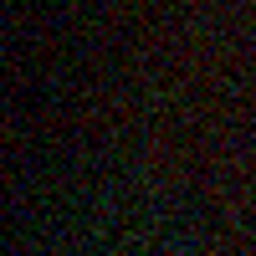

PSNR from output: 36.17885923958629
Output


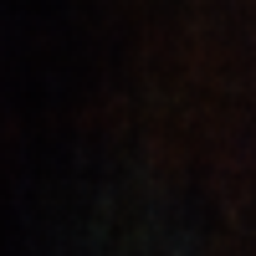

Ground truth:


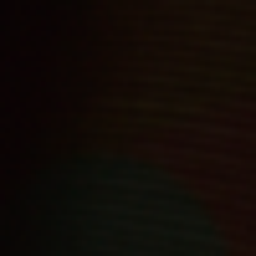

PSNR from input: 24.60346965316001
Input: 


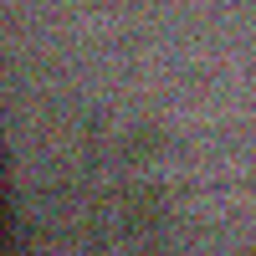

PSNR from output: 31.325408546914076
Output


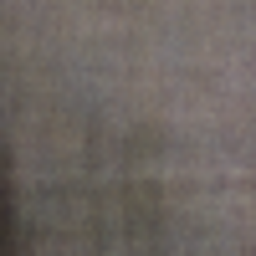

Ground truth:


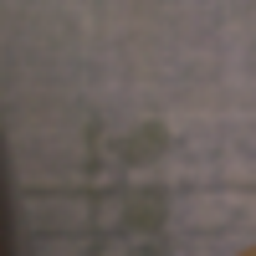

PSNR from input: 24.593066466611756
Input: 


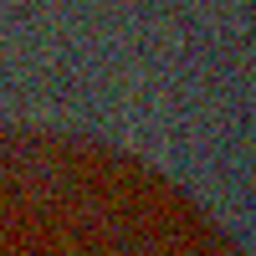

PSNR from output: 28.63335685727681
Output


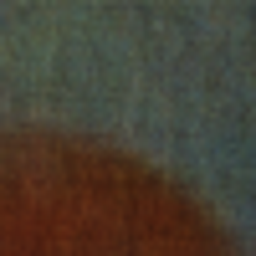

Ground truth:


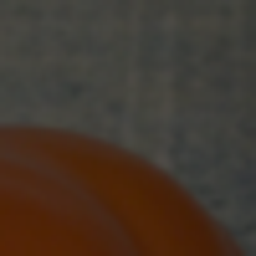

PSNR from input: 24.72112059270641
Input: 


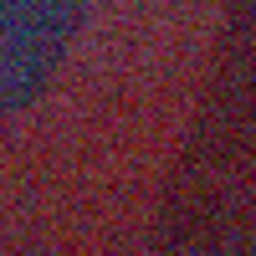

PSNR from output: 31.053186633044326
Output


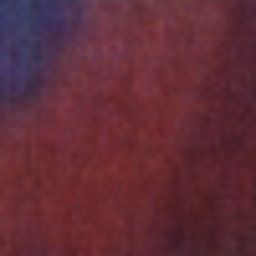

Ground truth:


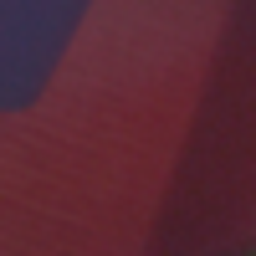

  1%|          | 3/256 [00:01<02:14,  1.88it/s]

PSNR from input: 24.64955695979572
Input: 


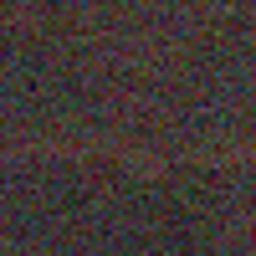

PSNR from output: 36.414331909276456
Output


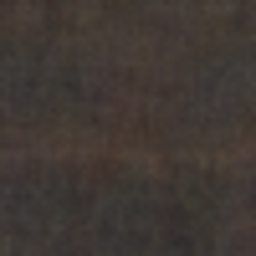

Ground truth:


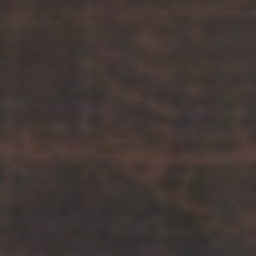

PSNR from input: 24.71376425889302
Input: 


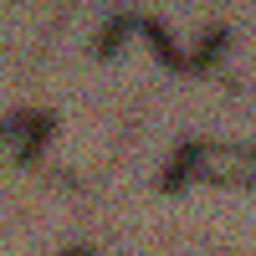

PSNR from output: 31.534112272869216
Output


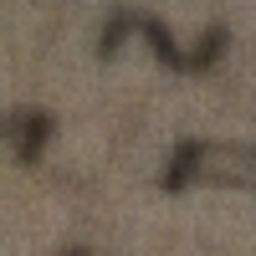

Ground truth:


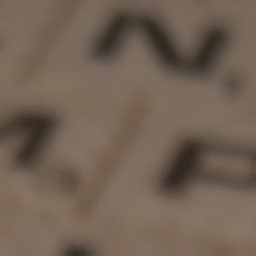

PSNR from input: 24.87540904414148
Input: 


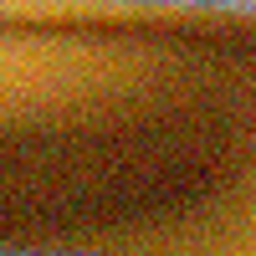

PSNR from output: 28.071951298609793
Output


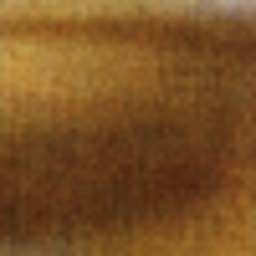

Ground truth:


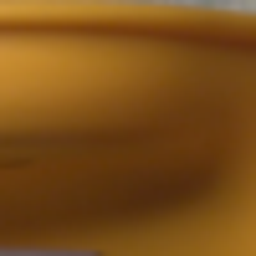

PSNR from input: 25.70178254182673
Input: 


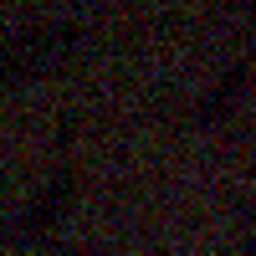

PSNR from output: 35.77474821507061
Output


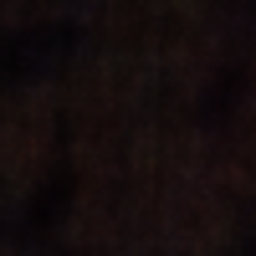

Ground truth:


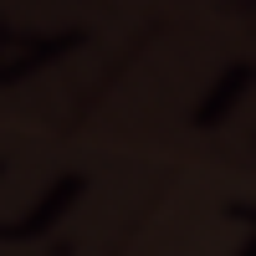

PSNR from input: 24.51853495141141
Input: 


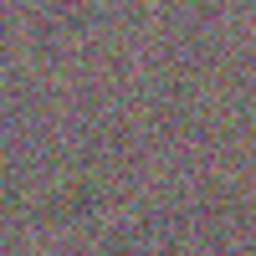

PSNR from output: 33.571894933828055
Output


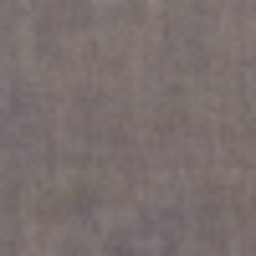

Ground truth:


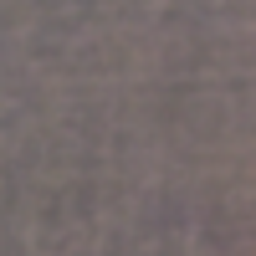

  2%|▏         | 4/256 [00:02<02:15,  1.87it/s]

PSNR from input: 26.590530423417018
Input: 


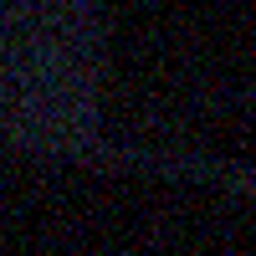

PSNR from output: 38.296697663494854
Output


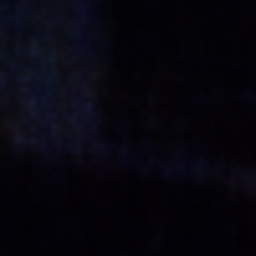

Ground truth:


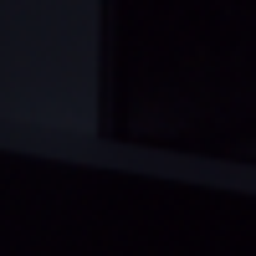

PSNR from input: 24.628437048374593
Input: 


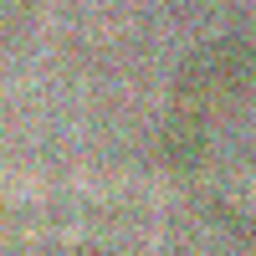

PSNR from output: 30.62835757758925
Output


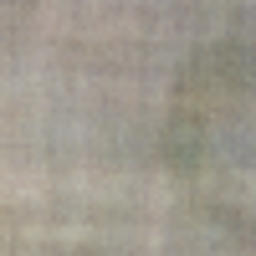

Ground truth:


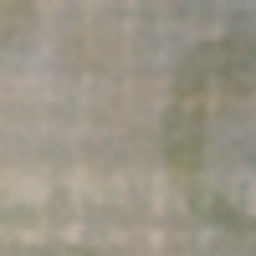

PSNR from input: 25.663097684251277
Input: 


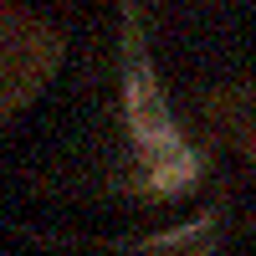

PSNR from output: 32.43658983281834
Output


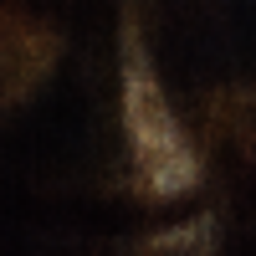

Ground truth:


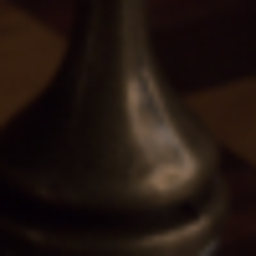

PSNR from input: 24.395257735731526
Input: 


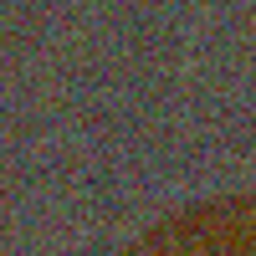

PSNR from output: 32.69217931835964
Output


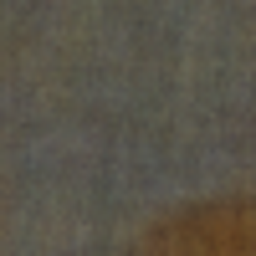

Ground truth:


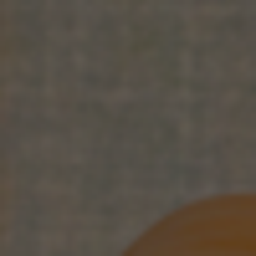

PSNR from input: 24.99923975066003
Input: 


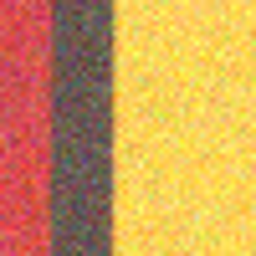

PSNR from output: 19.92953866661403
Output


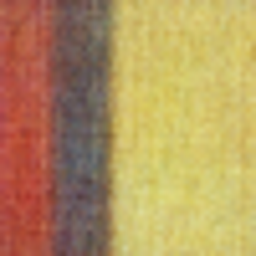

Ground truth:


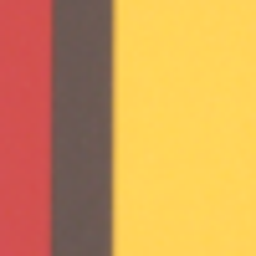

  2%|▏         | 4/256 [00:02<02:47,  1.50it/s]

Epoch: 4, Test MSE Loss: 0.0012499976390340428, Test PSNR: 31.11440858514272


(0.0012499976390340428, 31.11440858514272)

In [47]:
test_with_images(sidd_test_loader, cnn_model)

  0%|          | 0/13 [00:00<?, ?it/s]

PSNR from input: 25.50888689863371
Input: 


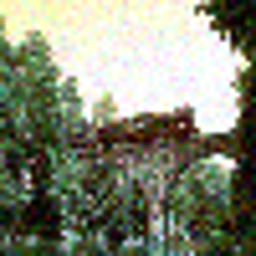

PSNR from output: 17.610187069673305
Output


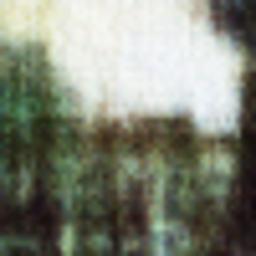

Ground truth:


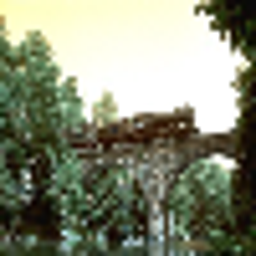

PSNR from input: 24.91570583201117
Input: 


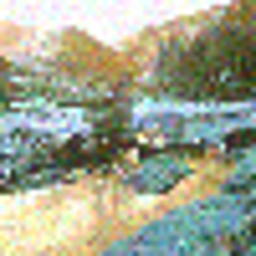

PSNR from output: 18.93074232987875
Output


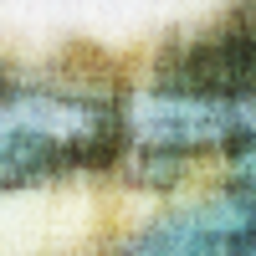

Ground truth:


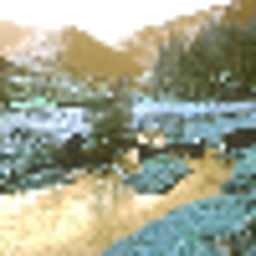

PSNR from input: 25.141267469802543
Input: 


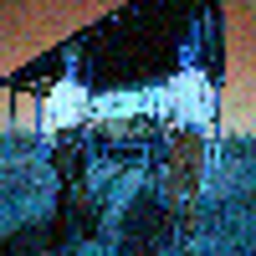

PSNR from output: 18.68512343886078
Output


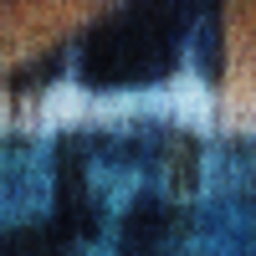

Ground truth:


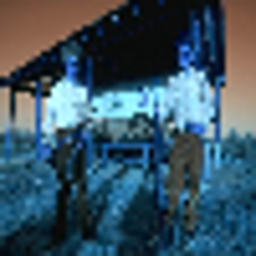

PSNR from input: 24.610508036821624
Input: 


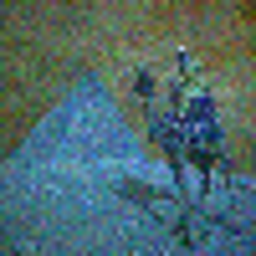

PSNR from output: 25.50292835347022
Output


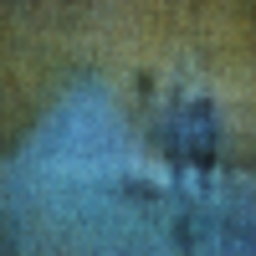

Ground truth:


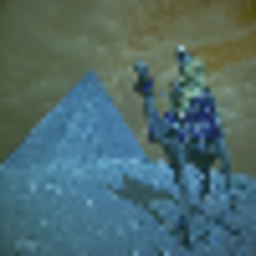

PSNR from input: 24.89585404599247
Input: 


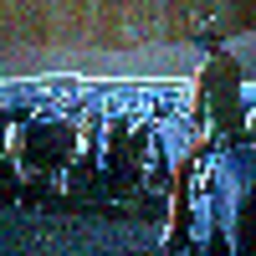

PSNR from output: 17.597512286178425
Output


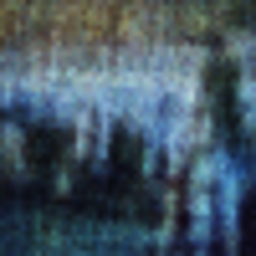

Ground truth:


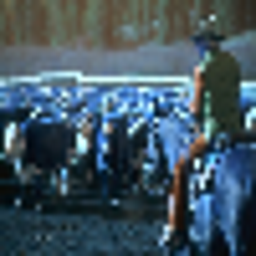

  8%|▊         | 1/13 [00:00<00:10,  1.15it/s]

PSNR from input: 24.826886102518042
Input: 


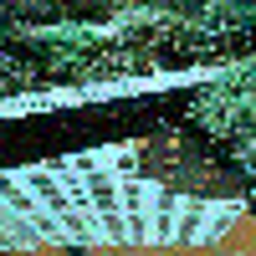

PSNR from output: 15.263639140115192
Output


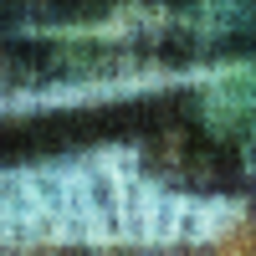

Ground truth:


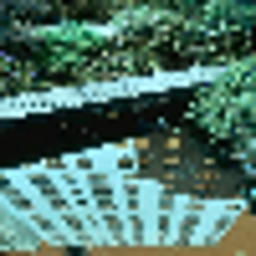

PSNR from input: 24.821989149989818
Input: 


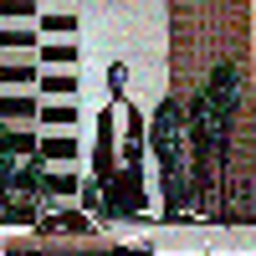

PSNR from output: 15.732896283490213
Output


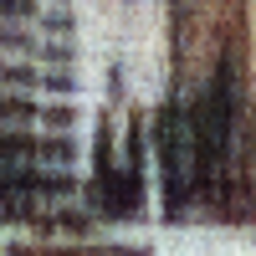

Ground truth:


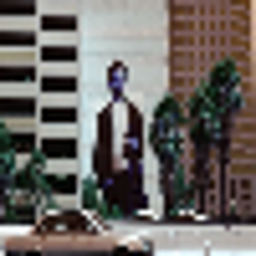

PSNR from input: 24.76725280818599
Input: 


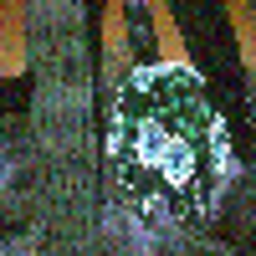

PSNR from output: 18.95447960421132
Output


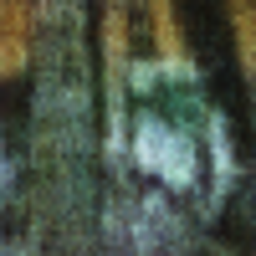

Ground truth:


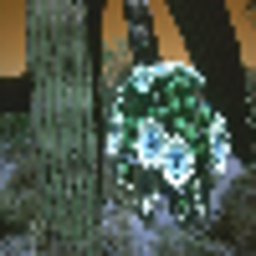

PSNR from input: 25.11378629093378
Input: 


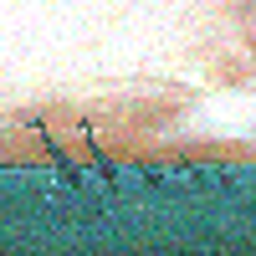

PSNR from output: 23.920939041214844
Output


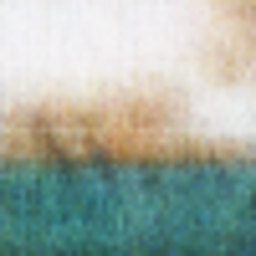

Ground truth:


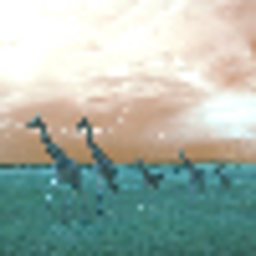

PSNR from input: 24.635614663959817
Input: 


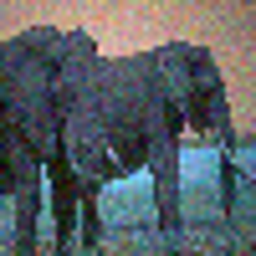

PSNR from output: 22.811981475911477
Output


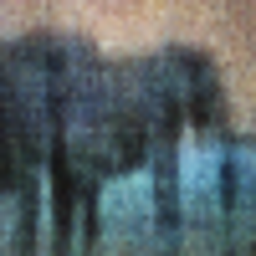

Ground truth:


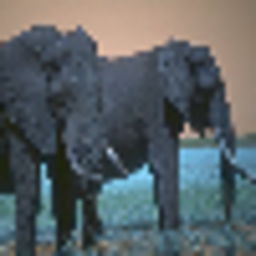

 15%|█▌        | 2/13 [00:01<00:07,  1.44it/s]

PSNR from input: 24.85276030546123
Input: 


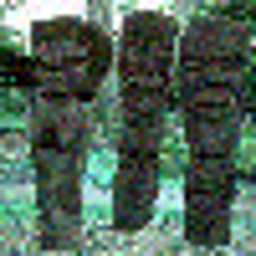

PSNR from output: 18.54800213969004
Output


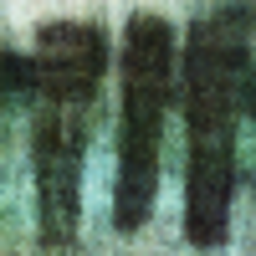

Ground truth:


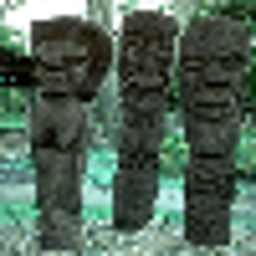

PSNR from input: 24.625291415338197
Input: 


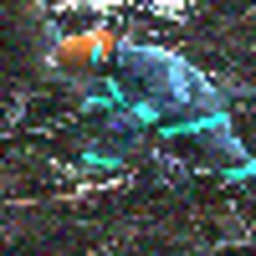

PSNR from output: 17.5846038047018
Output


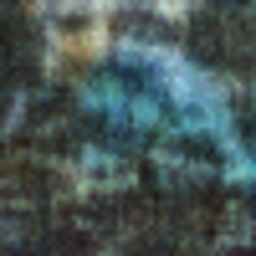

Ground truth:


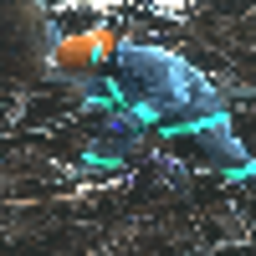

PSNR from input: 24.71258103423156
Input: 


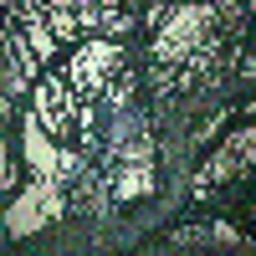

PSNR from output: 16.185067190802947
Output


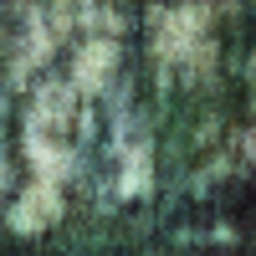

Ground truth:


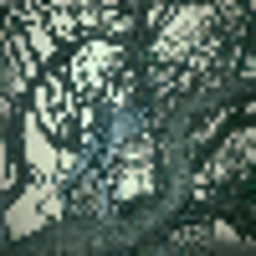

PSNR from input: 24.655710277398338
Input: 


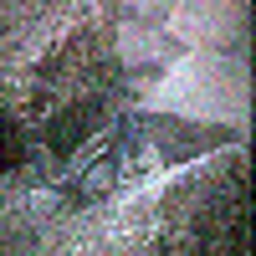

PSNR from output: 21.826218133378052
Output


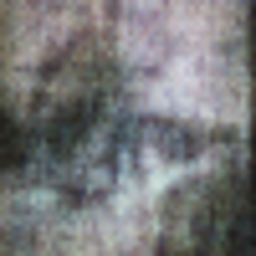

Ground truth:


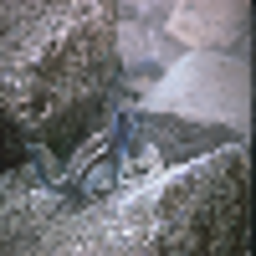

PSNR from input: 24.780602350958098
Input: 


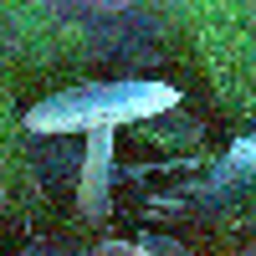

PSNR from output: 20.743806597142303
Output


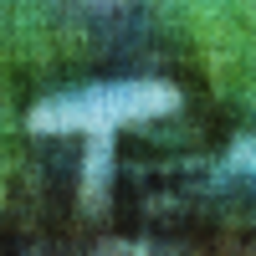

Ground truth:


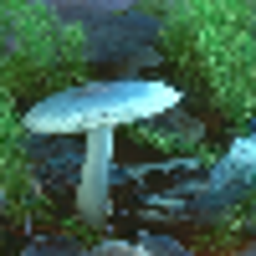

 23%|██▎       | 3/13 [00:02<00:06,  1.55it/s]

PSNR from input: 24.559304483685686
Input: 


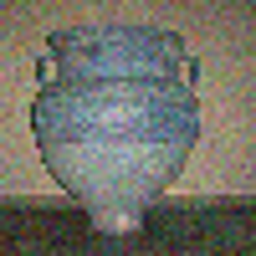

PSNR from output: 24.54198098470185
Output


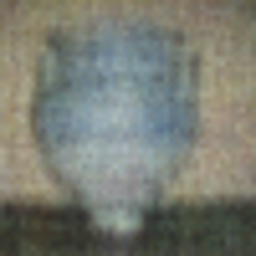

Ground truth:


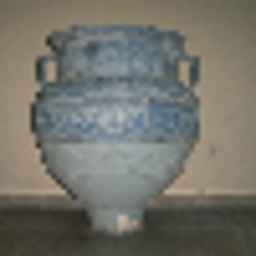

PSNR from input: 24.853897172126178
Input: 


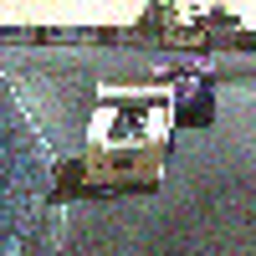

PSNR from output: 18.470692459749213
Output


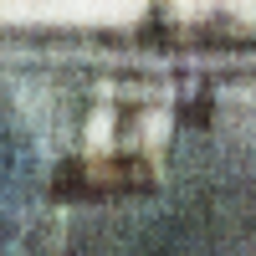

Ground truth:


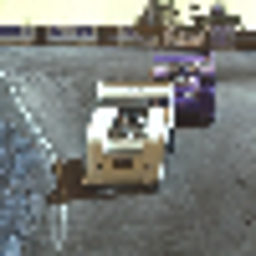

PSNR from input: 25.0270402252904
Input: 


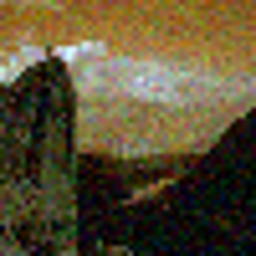

PSNR from output: 23.198551874553416
Output


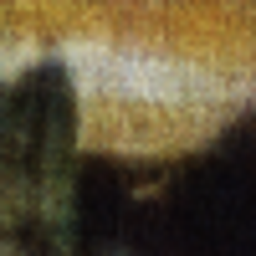

Ground truth:


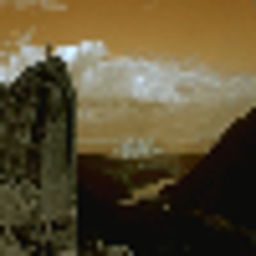

PSNR from input: 24.712835020010232
Input: 


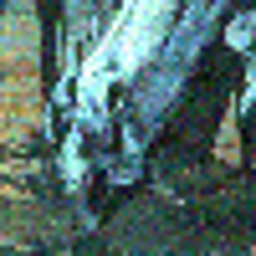

PSNR from output: 19.08760951325999
Output


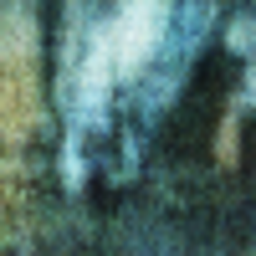

Ground truth:


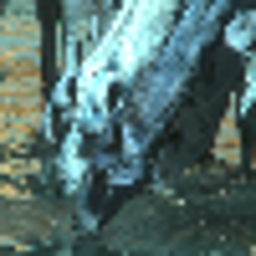

PSNR from input: 25.64482680268641
Input: 


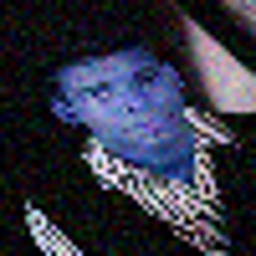

PSNR from output: 17.665366152504603
Output


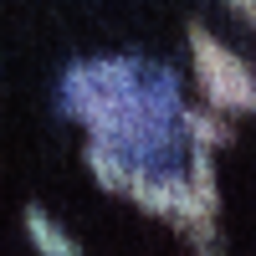

Ground truth:


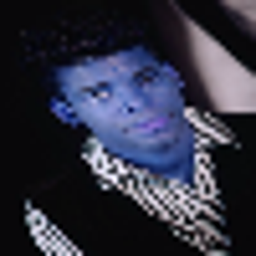

 31%|███       | 4/13 [00:02<00:05,  1.62it/s]

PSNR from input: 24.676807748919632
Input: 


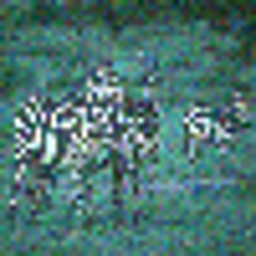

PSNR from output: 18.828792190737534
Output


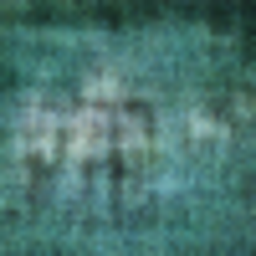

Ground truth:


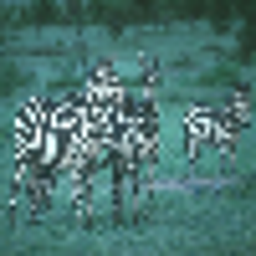

PSNR from input: 25.085915313681898
Input: 


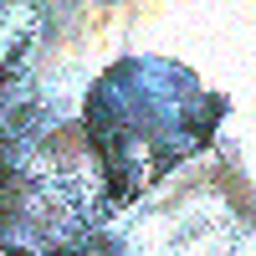

PSNR from output: 19.320011654859893
Output


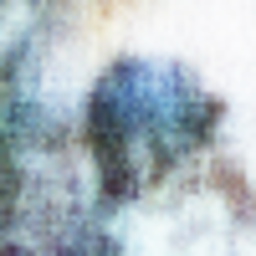

Ground truth:


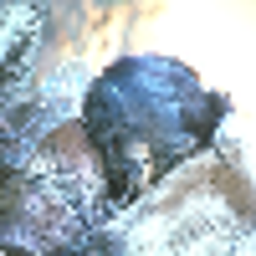

PSNR from input: 24.733536848044835
Input: 


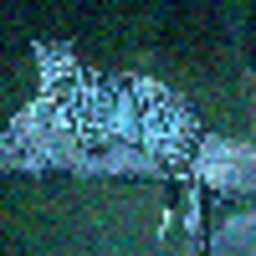

PSNR from output: 20.658580164347576
Output


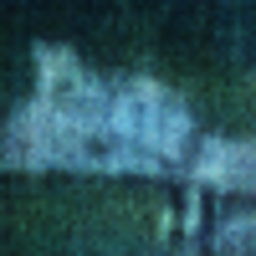

Ground truth:


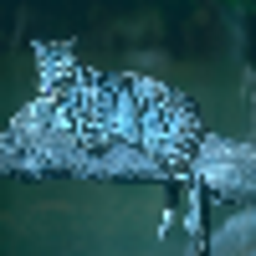

PSNR from input: 24.98262110085989
Input: 


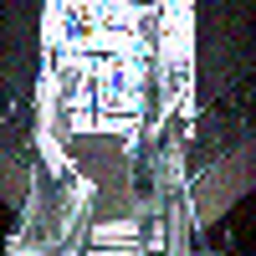

PSNR from output: 16.043983601964264
Output


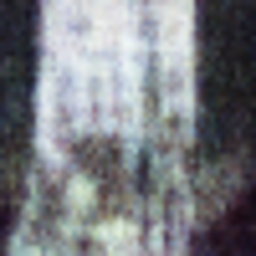

Ground truth:


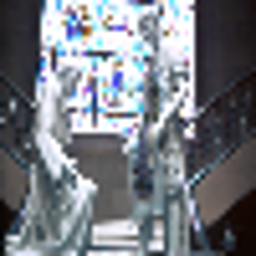

PSNR from input: 26.253518600079918
Input: 


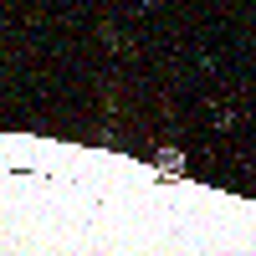

PSNR from output: 17.795291379241366
Output


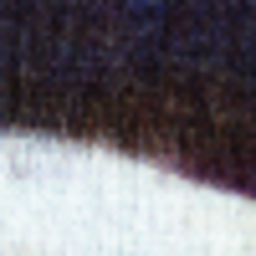

Ground truth:


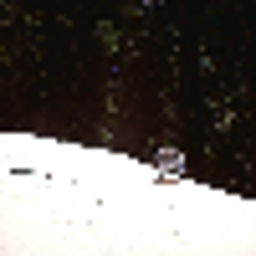

 31%|███       | 4/13 [00:03<00:07,  1.21it/s]

Epoch: 4, Test MSE Loss: 0.013586701825261116, Test PSNR: 19.420359474585574


(0.013586701825261116, 19.420359474585574)

In [48]:
test_with_images(cbsd_test_loader, cnn_model)

  0%|          | 0/4 [00:00<?, ?it/s]

PSNR from input: 24.79134010572498
Input: 


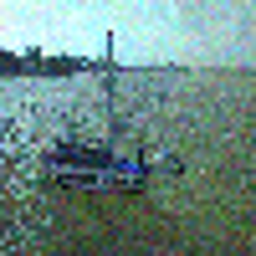

PSNR from output: 21.33959167514569
Output


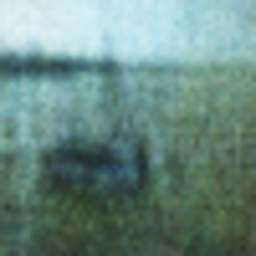

Ground truth:


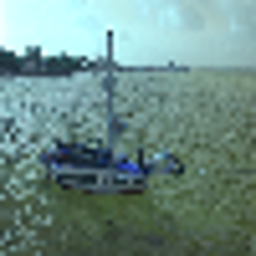

PSNR from input: 24.698442862701334
Input: 


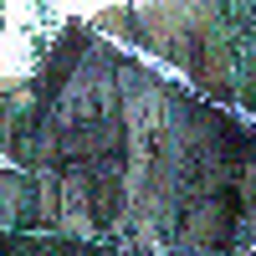

PSNR from output: 18.94853511414064
Output


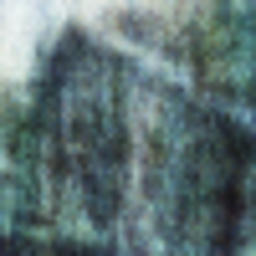

Ground truth:


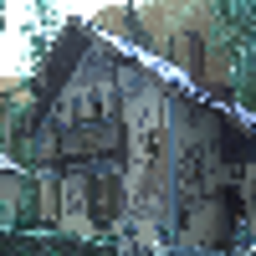

PSNR from input: 24.904715398307744
Input: 


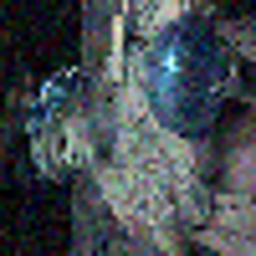

PSNR from output: 21.252963662527083
Output


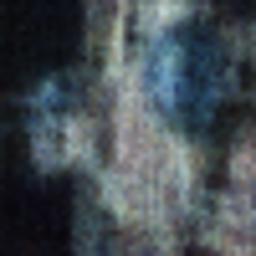

Ground truth:


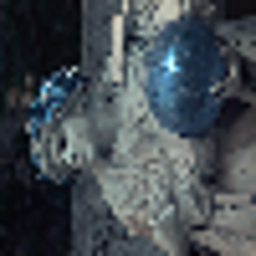

PSNR from input: 24.731441314178127
Input: 


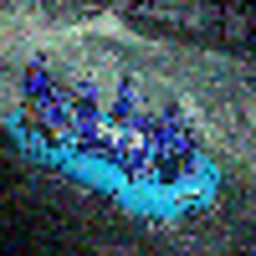

PSNR from output: 19.171408561644057
Output


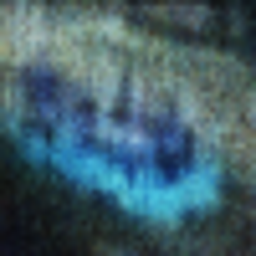

Ground truth:


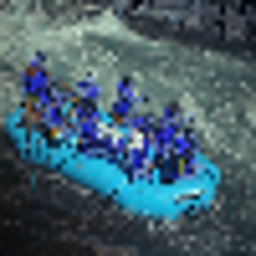

PSNR from input: 25.731401897000502
Input: 


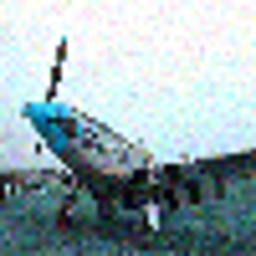

PSNR from output: 19.197064231135975
Output


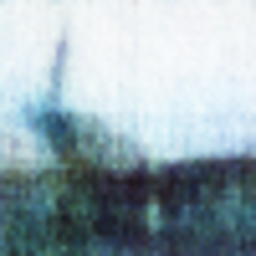

Ground truth:


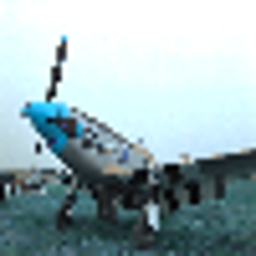

 25%|██▌       | 1/4 [00:00<00:02,  1.13it/s]

PSNR from input: 24.763903551352143
Input: 


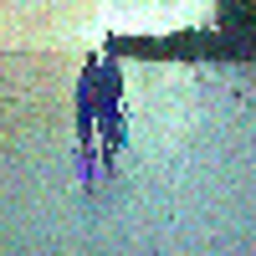

PSNR from output: 22.62705326926109
Output


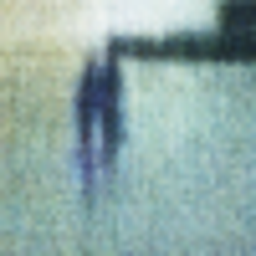

Ground truth:


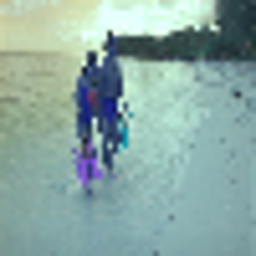

PSNR from input: 24.588484697409587
Input: 


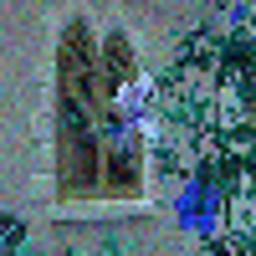

PSNR from output: 20.258590248191275
Output


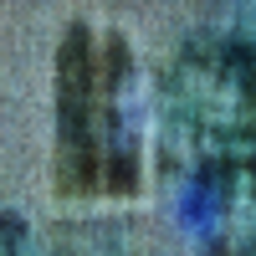

Ground truth:


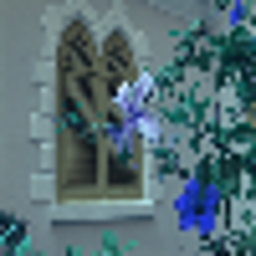

PSNR from input: 24.647728072598085
Input: 


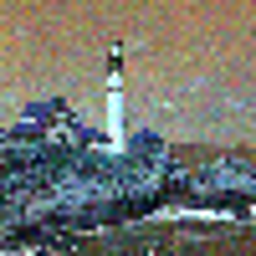

PSNR from output: 19.673813605262218
Output


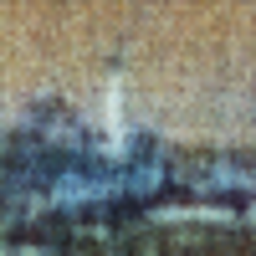

Ground truth:


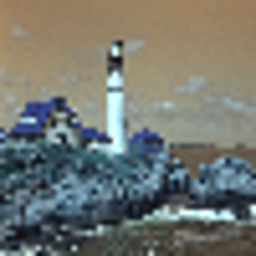

PSNR from input: 24.436144228482295
Input: 


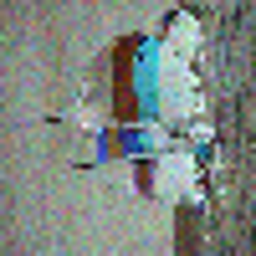

PSNR from output: 21.465028607551858
Output


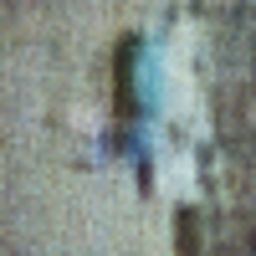

Ground truth:


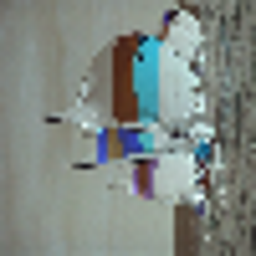

PSNR from input: 24.718608472929866
Input: 


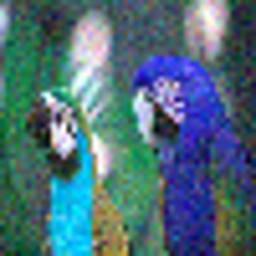

PSNR from output: 19.433692703180828
Output


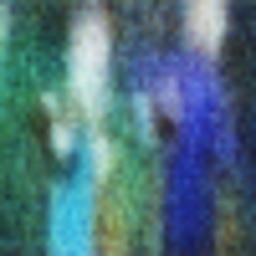

Ground truth:


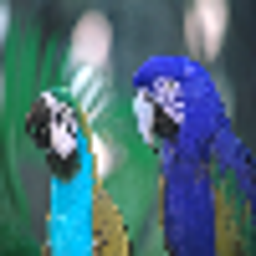

 50%|█████     | 2/4 [00:01<00:01,  1.43it/s]

PSNR from input: 24.588251087690924
Input: 


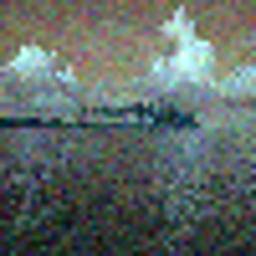

PSNR from output: 23.560099106395825
Output


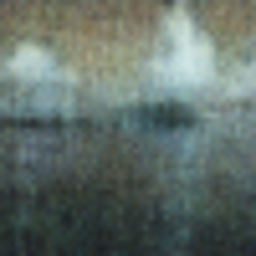

Ground truth:


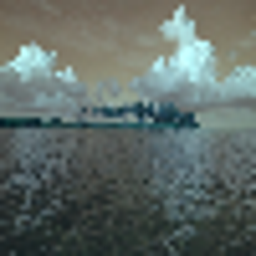

PSNR from input: 24.703842569220235
Input: 


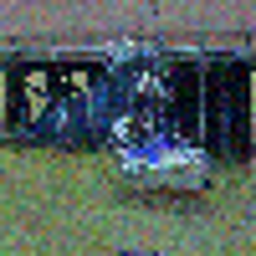

PSNR from output: 20.607875691041034
Output


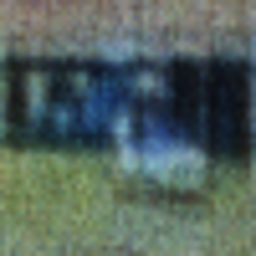

Ground truth:


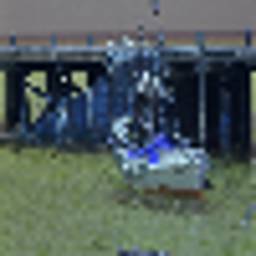

PSNR from input: 24.799326493601477
Input: 


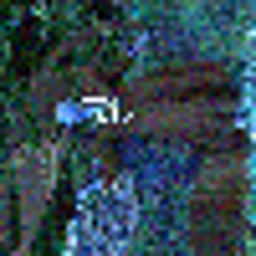

PSNR from output: 20.03202284428127
Output


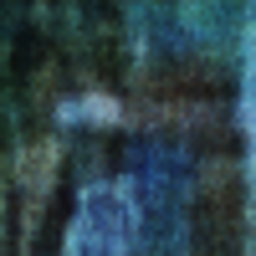

Ground truth:


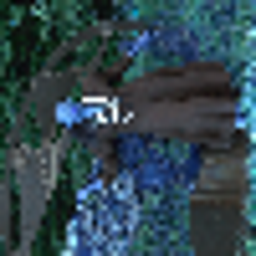

PSNR from input: 24.608803662085826
Input: 


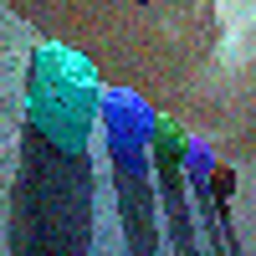

PSNR from output: 21.84340848513279
Output


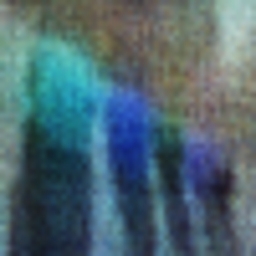

Ground truth:


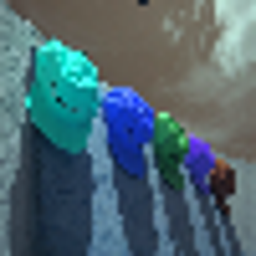

PSNR from input: 24.65564780338305
Input: 


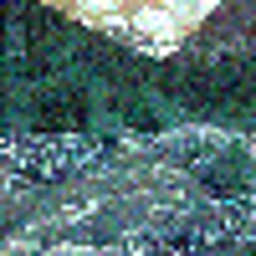

PSNR from output: 18.60477277182894
Output


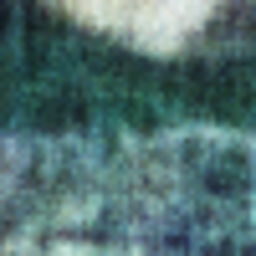

Ground truth:


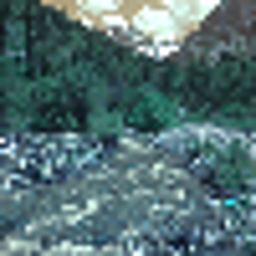

 75%|███████▌  | 3/4 [00:02<00:00,  1.57it/s]

PSNR from input: 24.702279977621536
Input: 


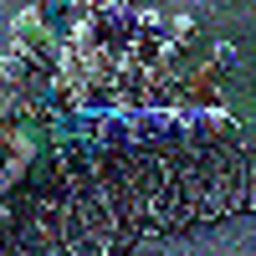

PSNR from output: 16.816041064738403
Output


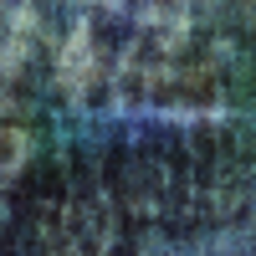

Ground truth:


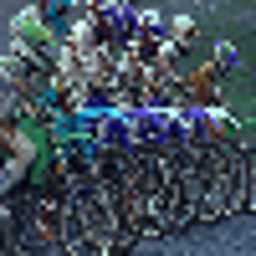

PSNR from input: 24.595916021216404
Input: 


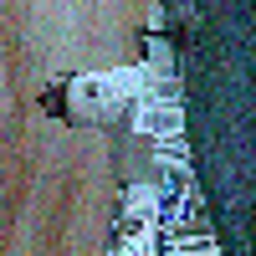

PSNR from output: 20.38352968013491
Output


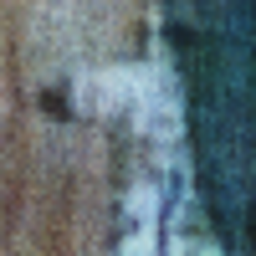

Ground truth:


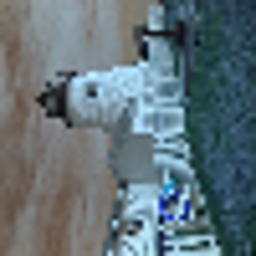

PSNR from input: 24.726113047430992
Input: 


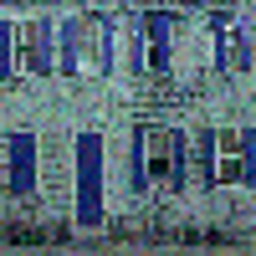

PSNR from output: 19.70513793703978
Output


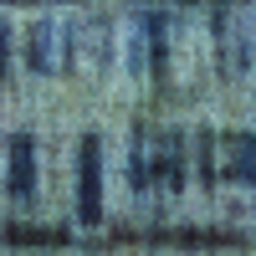

Ground truth:


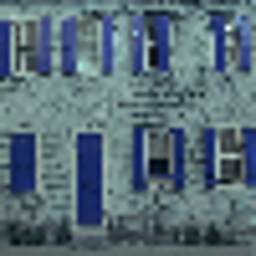

PSNR from input: 24.625857303186475
Input: 


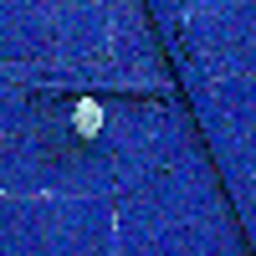

PSNR from output: 24.96954329810758
Output


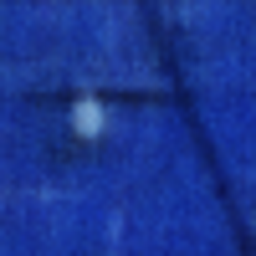

Ground truth:


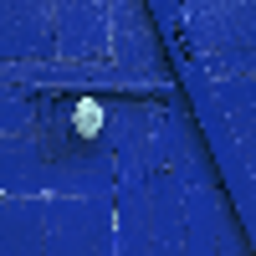

PSNR from input: 24.67192094329534
Input: 


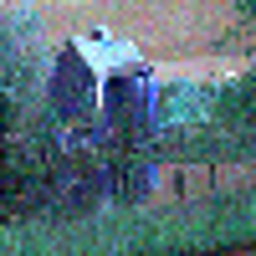

PSNR from output: 21.970845675714685
Output


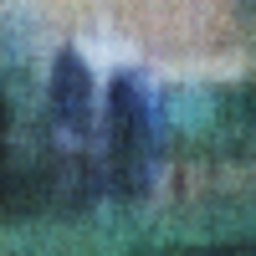

Ground truth:


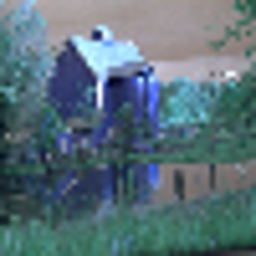

100%|██████████| 4/4 [00:02<00:00,  1.45it/s]

Epoch: 4, Test MSE Loss: 0.009473505662754178, Test PSNR: 20.593050911622797


(0.009473505662754178, 20.593050911622797)

In [49]:
test_with_images(kodak_test_loader, cnn_model)

In [60]:
a